In [1]:
import os
os.chdir('C:\\Users\\gutoa\\pypkg\\bempp') #Directory for bempp folder. 

import matplotlib.pyplot as plt
import pandas as pd
import bempp.api
import numpy as np
os.chdir('C:\\Users\\gutoa\\Documents\\UFSM\\TCC\\bemder\\bemder') #Directory for bemder folder

from bemder.bem_api_new import ExteriorBEM
import bemder.plot as bplt
import bemder.helpers as hh
from bemder import sources 
from bemder import receivers
from bemder import controlsair as ctrl
from bemder.bem_api_new import bem_load
from matplotlib import style
style.use("seaborn-talk")

Could not find Gmsh.Interactive plotting and shapes module not available.


In [2]:
AP = ctrl.AirProperties() #Initialized class for air properties, allowing to set c0 and rho0 or calculate
                                # it from temperature and humidity.


AP.c0 = 343
AP.rho0 = 1.21


AC = ctrl.AlgControls(AP.c0, 200,2500,500) #Defines frequencies of analysis

AC.freq = [500,1000,1500,2000,2500]
#% Load mesh

sky = 'Skyline_QRD.msh'
sky_ref = 'Skyline_REF.msh'


sky = bempp.api.import_grid('Mshs/Diffusers/Skyline/'+sky)
sky_ref = bempp.api.import_grid('Mshs/Diffusers/Skyline/'+sky_ref)
grid = bempp.api.import_grid('Mshs/Diffusers/SC_Hassan/sc_ref.msh')

#Defining Sources and Receivers

S = sources.Source("spherical",coord=[200,0,0])
# S.set_ssph_sources(radius = 2.0, ns = 100, random = False, plot=False)
# S.arc_sources(200,37,[-90,90],axis = "z",random=False)
# S.plot()


R = receivers.Receiver()
#R.arc_receivers(20,90,[-90,90],axis = "z")
R.spherical_receivers(radius = 20, ns = 200, axis='x',random = False, plot=False)

The number of sources is: 642


In [6]:
SKY, sBD = bem_load("Mshs/Diffusers/Skyline/Skyline")
SKY_REF, srBD = bem_load("Mshs/Diffusers/Skyline/Skyline_ref")

	BEM loaded successfully.
	BEM loaded successfully.


In [4]:
bplt.plot_problem(sky)

In [7]:
s_pt,s_ps = SKY.point_evaluate(sBD,R)
sr_pt,sr_ps = SKY_REF.point_evaluate(srBD,R)

[[48.02394087 48.02443013 48.02425471 48.02540427 48.13333836 48.14198233
  48.14145514 48.02539013 48.02649361 48.14183418 48.14215997 48.24837458
  48.24902108 48.29628206 48.29384522 48.02794805 48.0292699  48.15692427
  48.15615475 48.41679951 48.28265891 48.27948401 48.44425008 48.44250786
  48.32548475 48.32909519 48.10100227 48.09858703 47.9820528  47.98115638
  48.21819442 48.21464991 48.55220371 48.55202554 48.43348191 48.43156515
  48.29366208 48.29714203 48.39013678 48.39147278 48.65832499 48.1839567
  48.189848   48.06059457 48.06510139 48.49366    48.49241879 48.33077063
  48.33648832 48.49656802 48.49300255 48.39073035 48.39685254 47.97940887
  47.98159897 48.69854789 48.70005087 48.11280252 48.10691893 48.21655273
  48.21048757 48.58929968 48.59763781 48.53452374 48.53634685 48.39550912
  48.38667906 48.67743997 48.05149684 48.0654923  48.70579779 48.71360654
  48.5757717  48.57216161 48.17719263 48.1613638  48.73313284 48.72944717
  48.36436564 48.3745444  48.54432985 4

[[48.07951972 48.08590956 48.07500209 48.04728175 48.147012   48.13959275
  48.12167099 48.01526938 48.03411241 48.08301682 48.1053167  48.2163996
  48.21420819 48.26172735 48.29376362 48.05011294 47.98939206 48.13982903
  48.11715757 48.34116057 48.24692307 48.21719382 48.44791907 48.35330721
  48.42400096 48.39745176 48.26367689 48.06811163 47.87888758 47.96333753
  48.23563062 48.10908174 48.43841679 48.50489964 48.41933407 48.45242804
  48.37330449 48.38324886 48.48910277 48.47868449 48.39606437 48.10607297
  48.22962456 48.01206577 48.07193237 48.61450316 48.6871436  48.29456659
  48.25389725 48.5211639  48.55391789 48.36542025 48.32827495 47.99627977
  48.0224557  48.75340484 48.74069238 48.1345228  48.12177407 48.27570584
  48.23329206 48.4902317  48.47936327 48.68334948 48.58962995 48.36735822
  48.267291   48.55770664 48.01629965 48.0582768  48.56229528 48.62606377
  48.47907765 48.68680464 48.16573708 48.2470845  48.59105915 48.7230883
  48.2725579  48.35643123 48.6190778  48

[[48.04472048 48.04471242 48.04186234 48.04185954 48.15089297 48.11561701
  48.1156308  48.03321081 48.03321862 48.13406399 48.13405636 48.24946574
  48.24945998 48.22146379 48.22146397 48.0273346  48.02731661 48.14318858
  48.14322228 48.42269731 48.25437526 48.25438249 48.33865801 48.33865391
  48.37928863 48.37929749 48.10099665 48.10102816 47.98707897 47.98709236
  48.22526341 48.22528709 48.51303851 48.51304097 48.46875968 48.46876432
  48.33964657 48.33968681 48.46429285 48.46428698 48.61534178 48.17441113
  48.17441274 48.05443852 48.05444504 48.60685756 48.60685655 48.30208117
  48.30210778 48.59163198 48.59163468 48.43212471 48.43212245 47.98706404
  47.98705853 48.63708075 48.63706422 48.12033217 48.12032961 48.24335168
  48.24336363 48.55219534 48.5521643  48.58022536 48.58021361 48.39333226
  48.39332428 48.84629771 48.05230748 48.05231048 48.64314735 48.64310512
  48.49180669 48.49181888 48.19420369 48.19421122 48.63801075 48.63801643
  48.32897753 48.32898401 48.62522384 

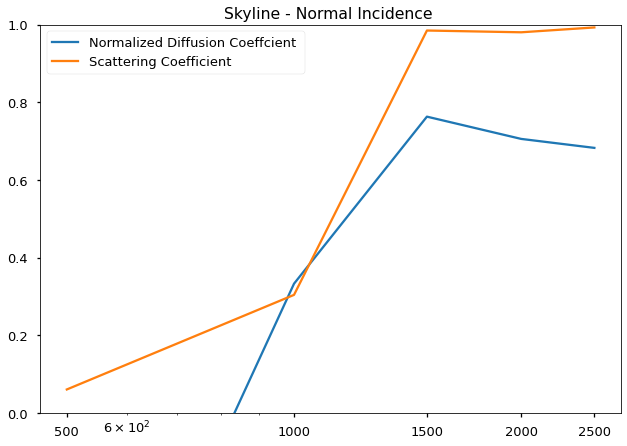

In [8]:
Tfq = hh.diffusion_coef(AC.freq, s_ps,sr_ps,plot=False)

sfq = hh.scattering_coef(AC.freq, s_ps,sr_ps,plot=False)


fig, ax = plt.subplots()
ax.set_ylim(0,1)
ax.semilogx(AC.freq,Tfq)
ax.semilogx(AC.freq,sfq)
ax.set_xticklabels(AC.freq)
ax.set_xticks(AC.freq)


# ax.plot(AC.freq,Treflex)
plt.legend(('Normalized Diffusion Coeffcient ','Scattering Coefficient'))
plt.title('Skyline - Normal Incidence ')
plt.savefig('skyline_T_s.png',dpi=500)
plt.show()

In [ ]:
bplt.polar_3d(R,np.array(s_ps[0,:]))